In [214]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


# !pip install scikit-learn matplotlib seaborn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import fetch_california_housing
from sklearn.feature_selection import (
    mutual_info_classif,  # Information Gain
    chi2,                    # Chi-square Test
    f_classif,               # ANOVA (F-test)
    SelectKBest,             # Select top k features
    VarianceThreshold        # Variance Threshold
)
from sklearn.preprocessing import StandardScaler, MinMaxScaler



In [215]:
import numba as nb
from matplotlib import cm
import seaborn as sns
%matplotlib inline
from scipy import stats
import matplotlib.colors as mcolors
from sklearn.svm import SVC
from sklearn.preprocessing import OneHotEncoder
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
import sklearn.metrics as skm
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from scipy.spatial.distance import cdist
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')
from numpy import loadtxt
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from collections import Counter
import math
from skrebate import ReliefF
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS


In [216]:
from sklearn_som.som import SOM
import shap
from lime import lime_tabular

In [217]:
# pip install shap lime


In [218]:

# !pip install sklearn-som

In [219]:
# !pip install -U som-learn

In [220]:
# !pip install skrebate


In [221]:
# !pip install mlxtend


In [222]:
df = pd.read_csv("/content/diabetes.csv")

In [223]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [224]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

# EDA

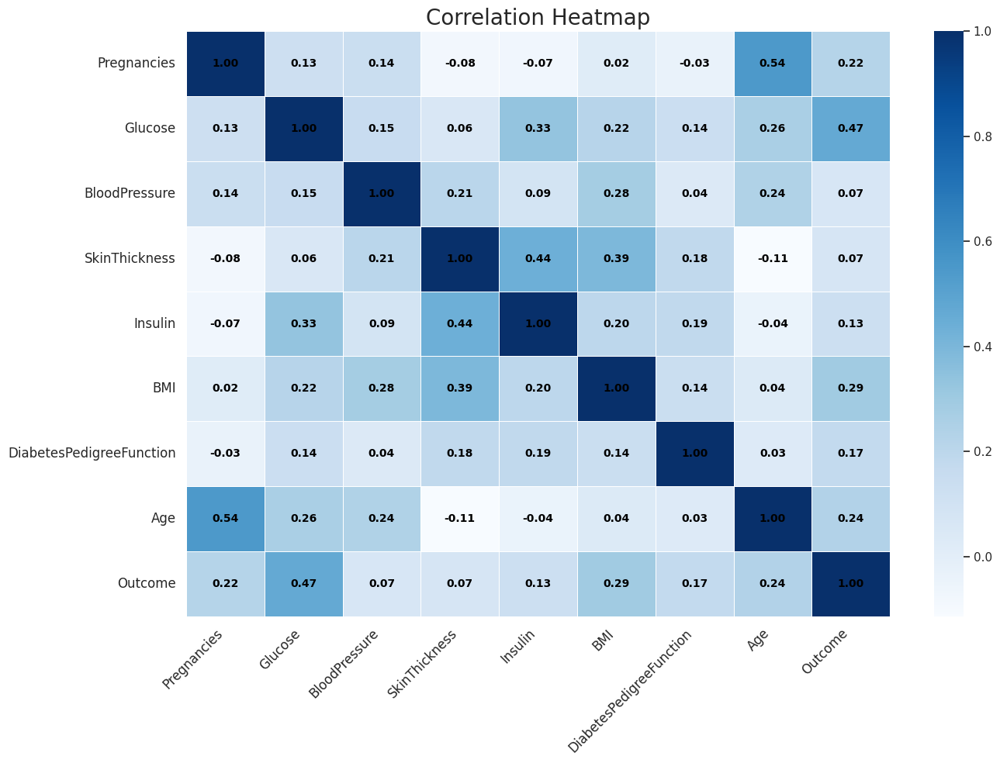

In [225]:
corr = df.corr()

# Create the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr, annot=True, cmap="Blues", linewidths=0.5, fmt=".2f", annot_kws={"size": 10, "weight": "bold", "color": "black"})

plt.title("Correlation Heatmap", fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()

plt.show()

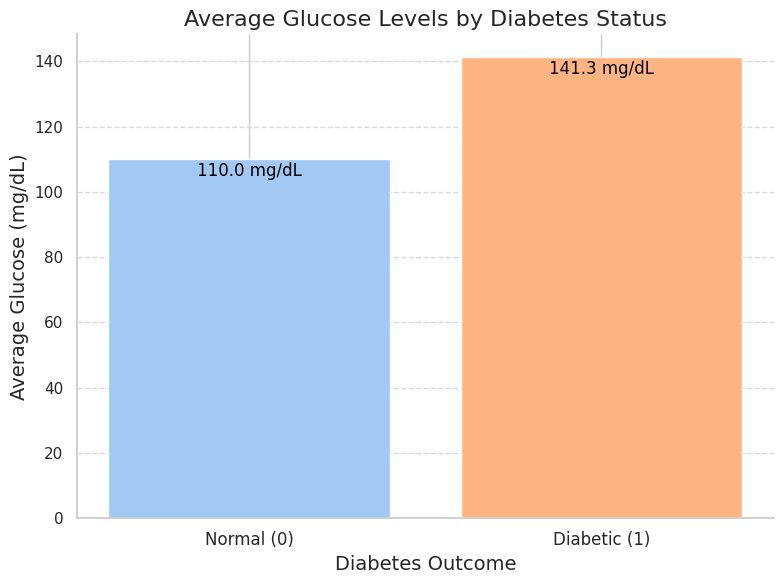

In [226]:

# Calculate average glucose by outcome
avg_glucose = df.groupby('Outcome')['Glucose'].mean().reset_index()

colors = sns.color_palette("pastel", len(avg_glucose))

# Creating the bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(avg_glucose['Outcome'], avg_glucose['Glucose'], color=colors)


for bar, avg in zip(bars, avg_glucose['Glucose']):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() - 5,
             f"{avg:.1f} mg/dL",
             ha='center',
             color='black',
             fontsize=12)

plt.title('Average Glucose Levels by Diabetes Status', fontsize=16)
plt.xlabel('Diabetes Outcome', fontsize=14)
plt.ylabel('Average Glucose (mg/dL)', fontsize=14)
plt.xticks(avg_glucose['Outcome'], ['Normal (0)', 'Diabetic (1)'], fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

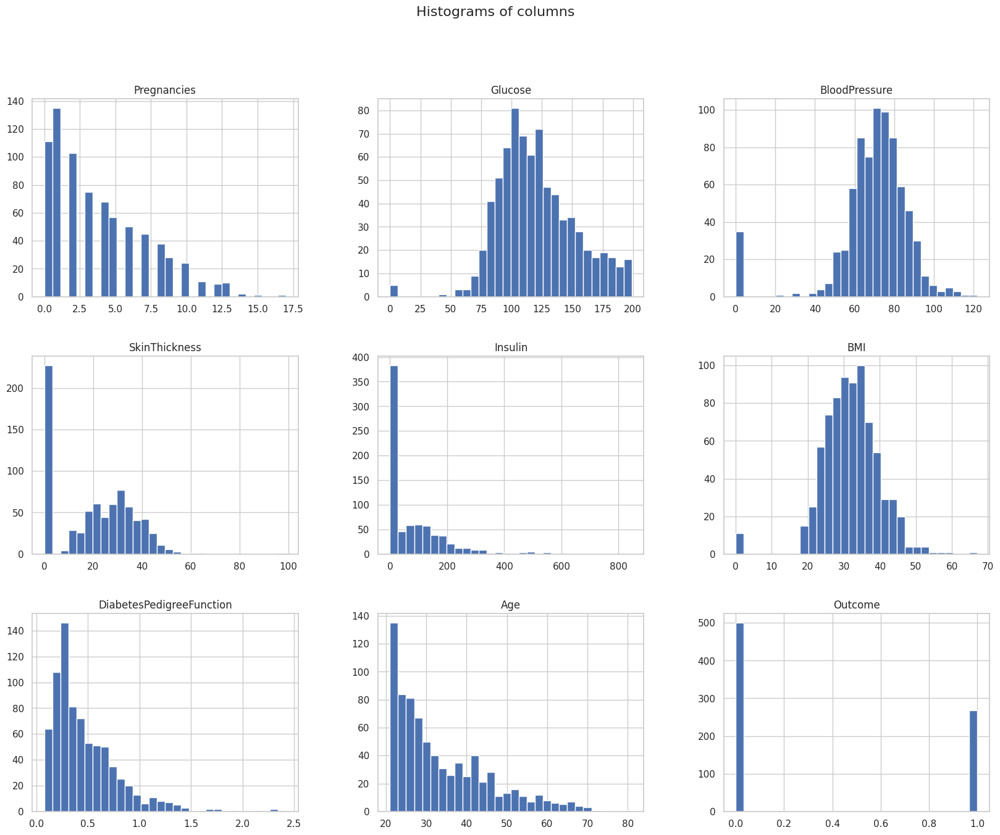

In [227]:
df.hist(figsize=(20, 15), bins=30)
plt.suptitle('Histograms of columns', fontsize=16)
plt.show()

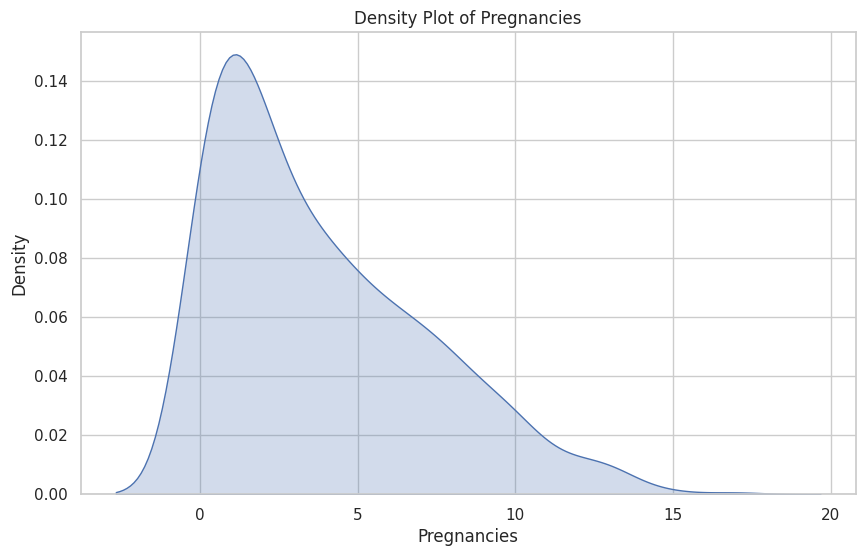

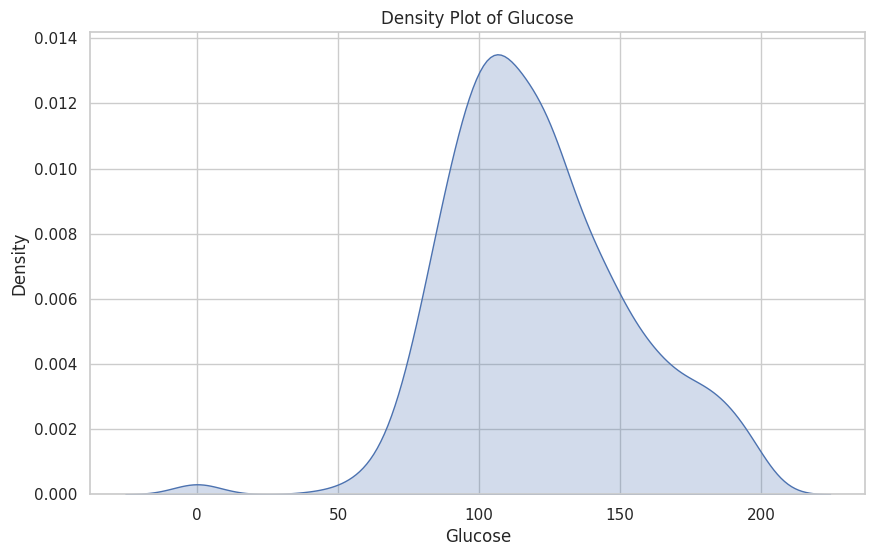

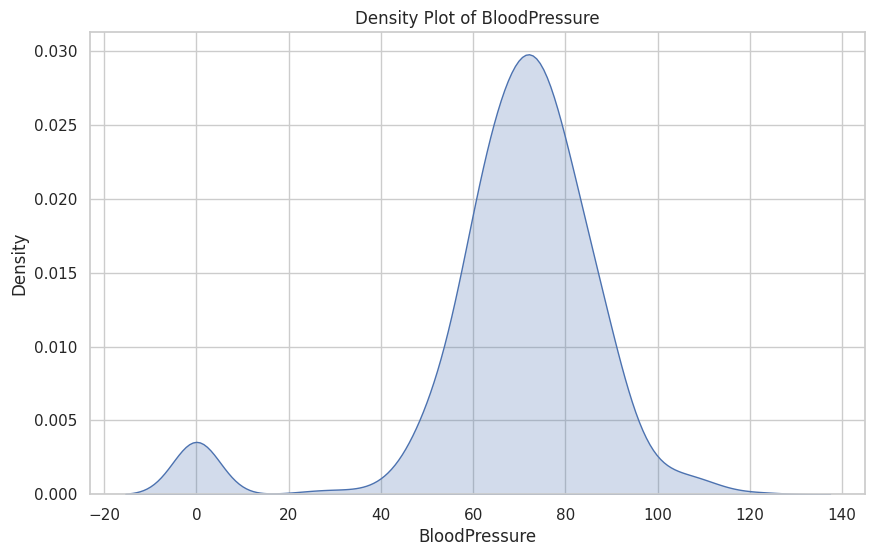

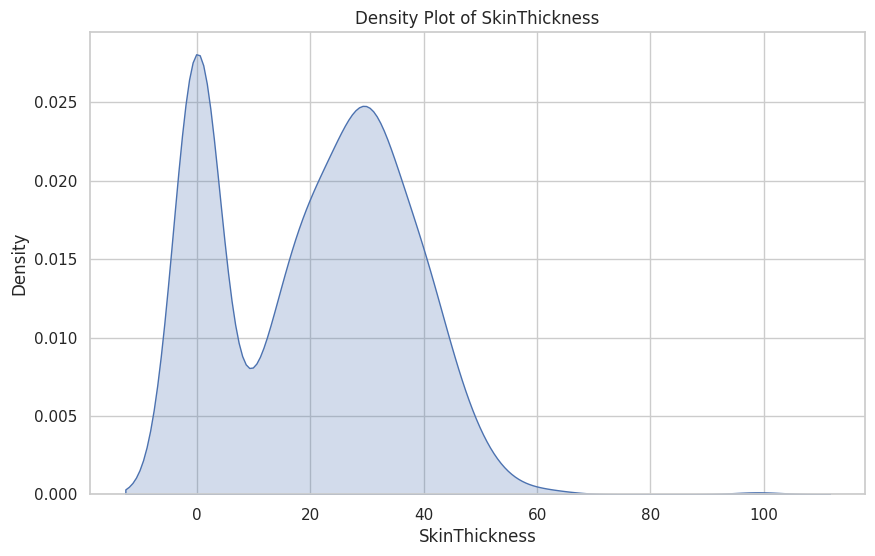

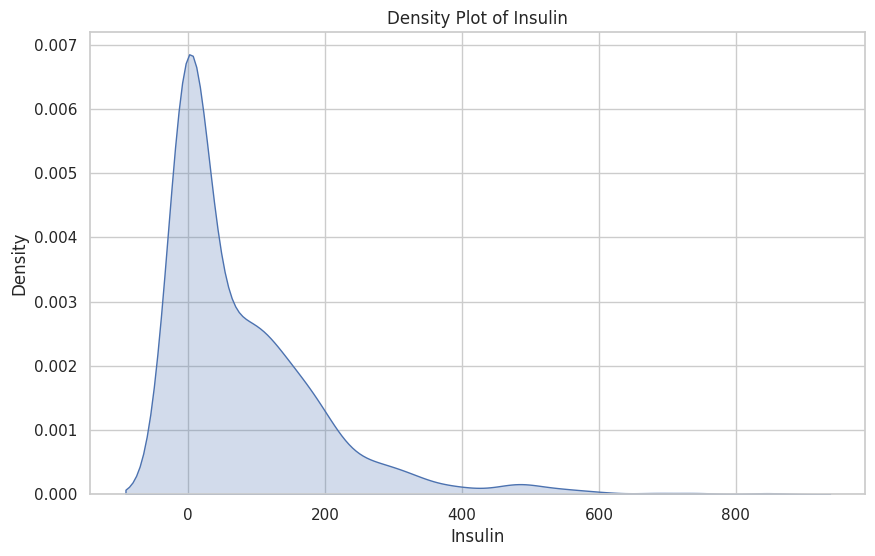

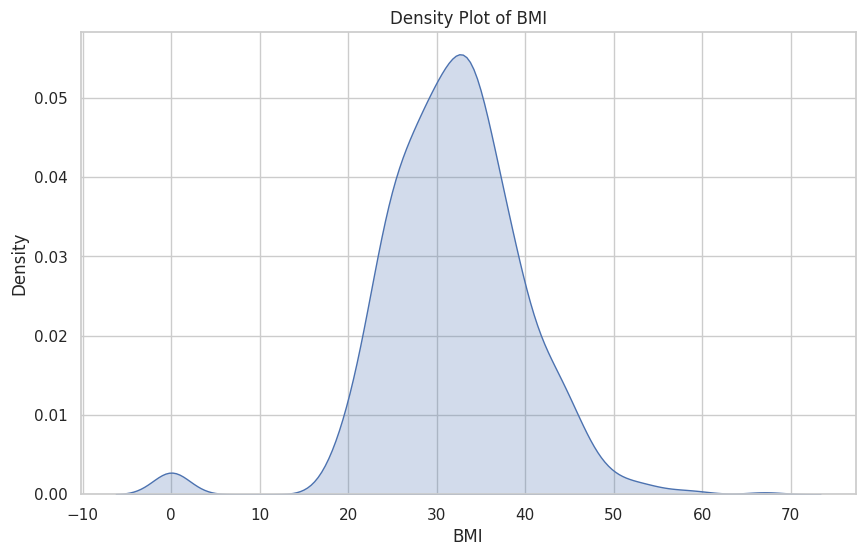

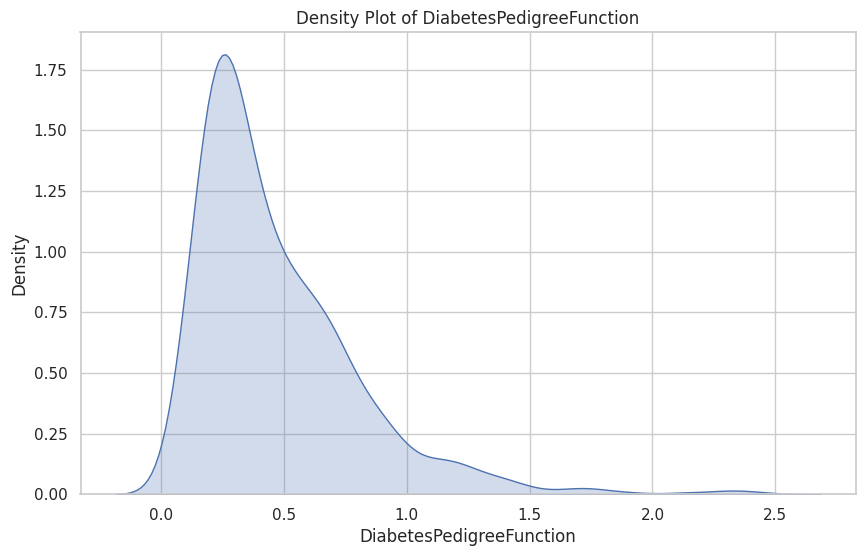

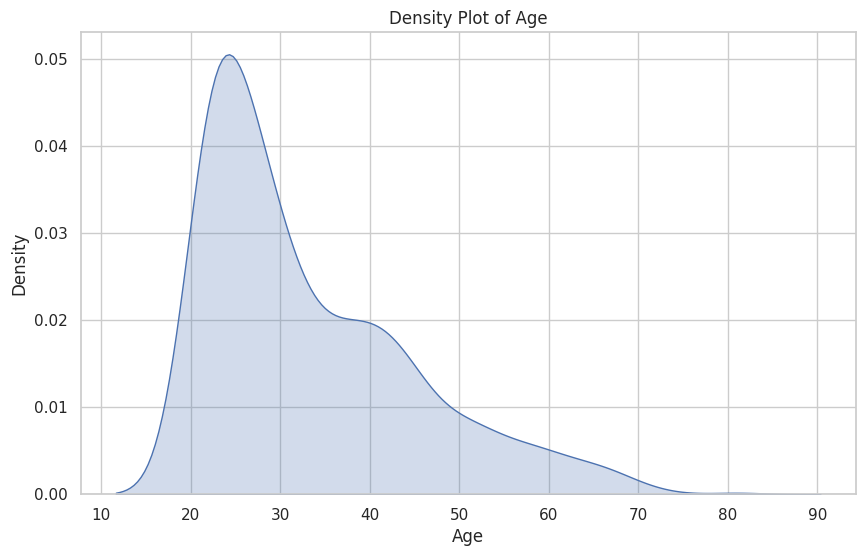

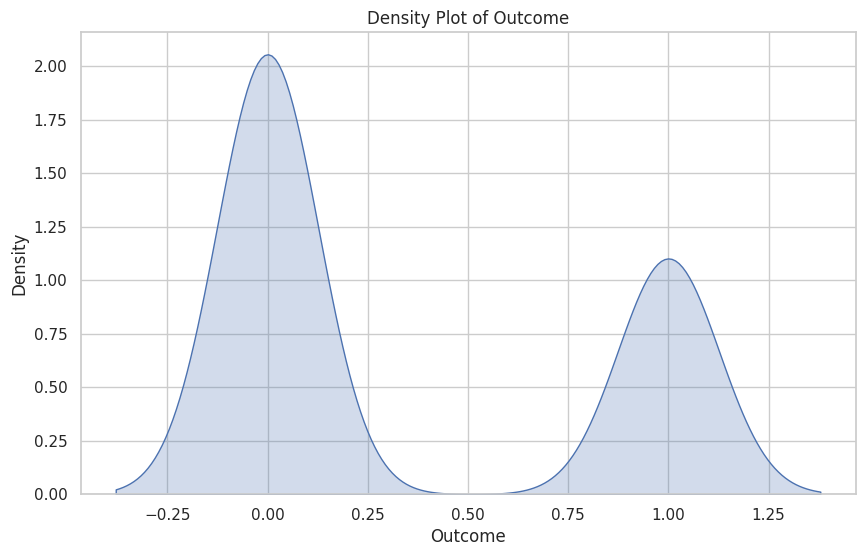

In [228]:
for column in df:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(df[column], shade=True)
    plt.title(f'Density Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.show()


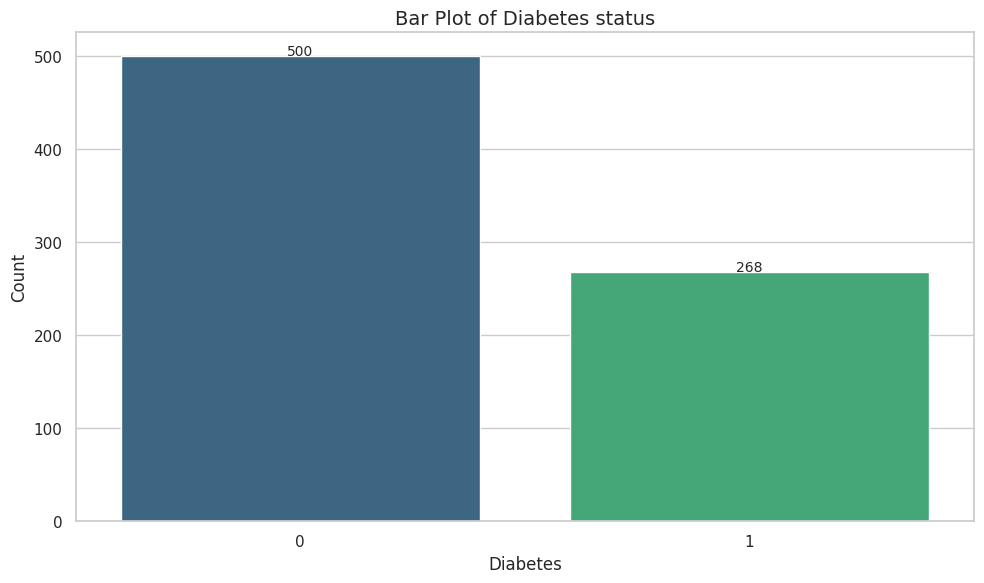

In [229]:
column = 'Outcome'
# Calculate the value counts for the column
value_counts = df[column].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=value_counts.index, y=value_counts.values, palette='viridis')

plt.title('Bar Plot of Diabetes status', fontsize=14)
plt.xlabel('Diabetes', fontsize=12)
plt.ylabel('Count', fontsize=12)

for i in range(len(value_counts)):
    plt.text(i, value_counts[i] + 0.5, str(value_counts[i]), ha='center', fontsize=10)

plt.tight_layout()
plt.show()

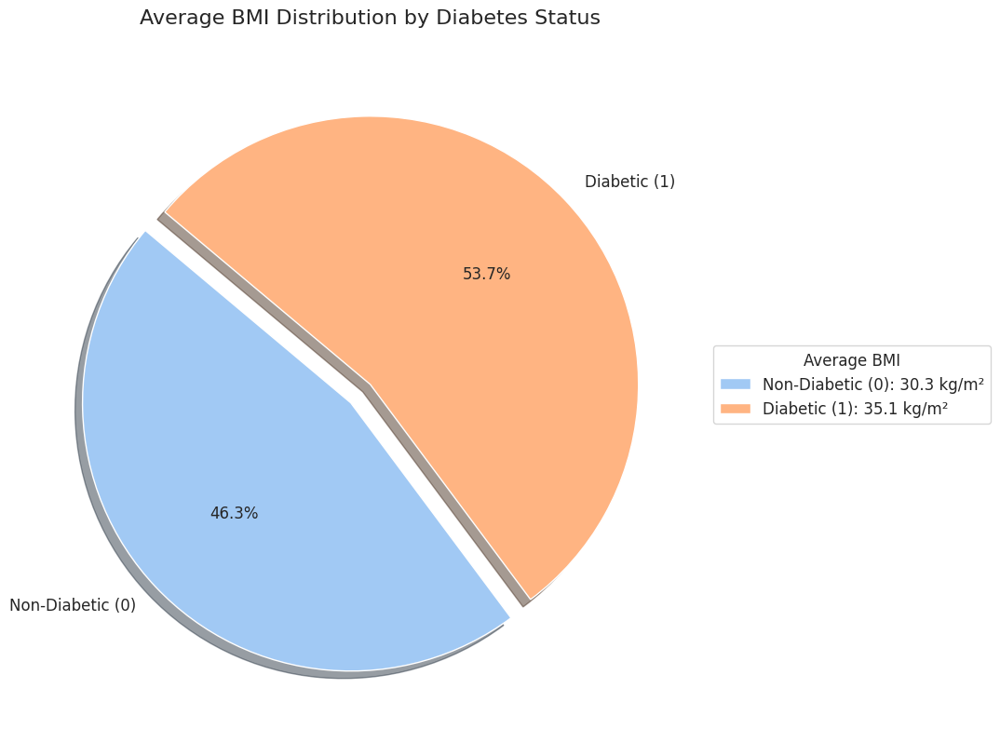

In [230]:
# Calculate average BMI by outcome
avg_bmi = df.groupby('Outcome')['BMI'].mean().reset_index()
plt.figure(figsize=(10, 8))

# Create a pie chart
explode = [0.1, 0]
colors = sns.color_palette("pastel", len(avg_bmi))

# Create the pie chart
wedges, texts, autotexts = plt.pie(
    avg_bmi['BMI'],
    labels=['Non-Diabetic (0)', 'Diabetic (1)'],
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    explode=explode,
    shadow=True,
    textprops={'fontsize': 12}
)

plt.title('Average BMI Distribution by Diabetes Status', fontsize=16, pad=20)
legend_labels = [f"{label}: {avg:.1f} kg/m²"
                for label, avg in zip(['Non-Diabetic (0)', 'Diabetic (1)'], avg_bmi['BMI'])]
plt.legend(wedges, legend_labels,
           title="Average BMI",
           loc="center left",
           bbox_to_anchor=(1, 0.5),
           fontsize=12)


plt.tight_layout()
plt.show()

<Figure size 1600x1000 with 0 Axes>

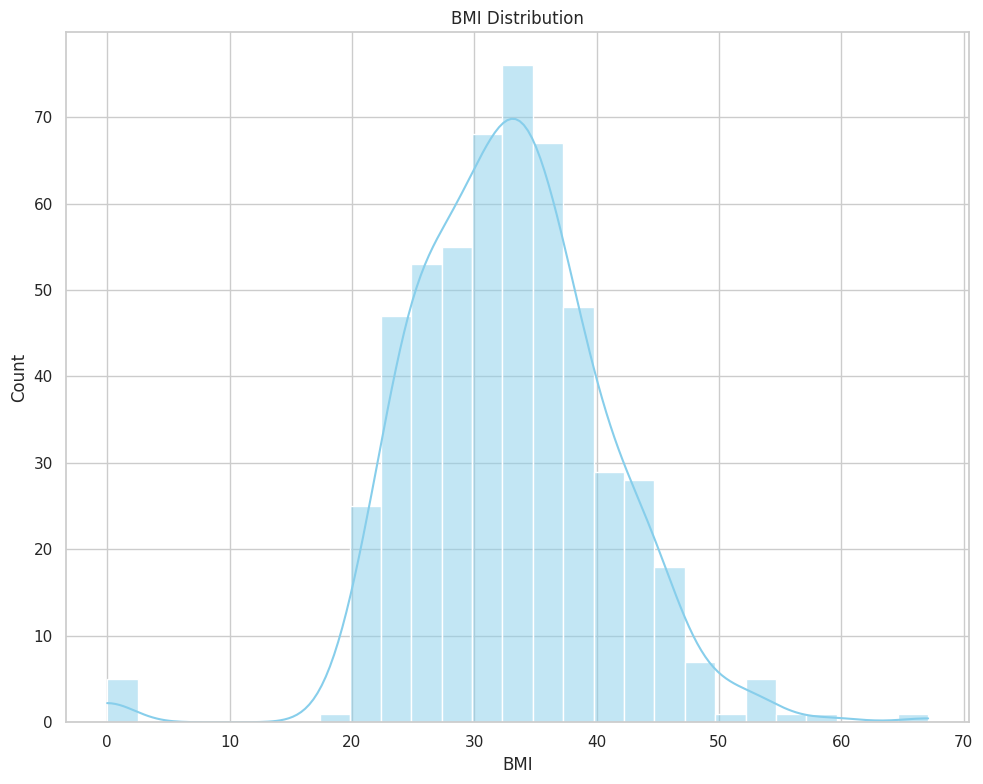

In [309]:
sns.set(style="whitegrid")
plt.figure(figsize=(16, 10))

# Distribution of BMI values among all patients
plt.figure(figsize=(10, 8))
sns.histplot(df['BMI'], kde=True, color='skyblue')
plt.title("BMI Distribution")
plt.xlabel("BMI")

plt.tight_layout()
plt.show()

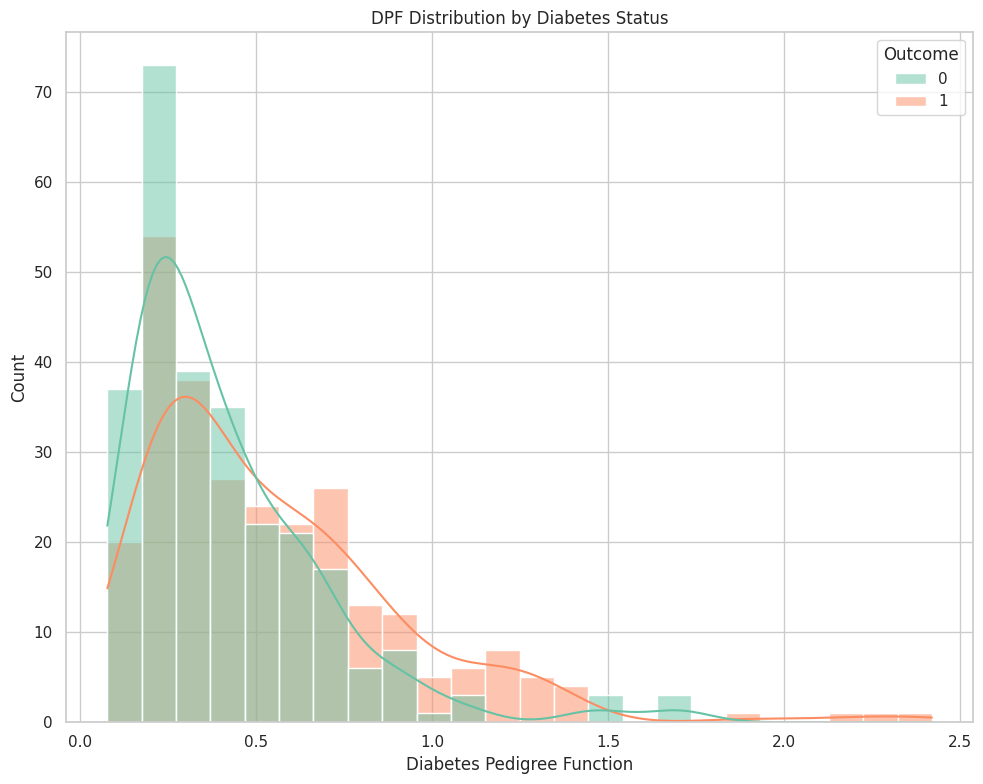

In [308]:
# Distribution of DPF values for diabetic and non-diabetic patients
plt.figure(figsize=(10, 8))
sns.histplot(data=df, x='DiabetesPedigreeFunction', hue='Outcome', kde=True, palette='Set2')
plt.title("DPF Distribution by Diabetes Status")
plt.xlabel("Diabetes Pedigree Function")

plt.tight_layout()
plt.show()

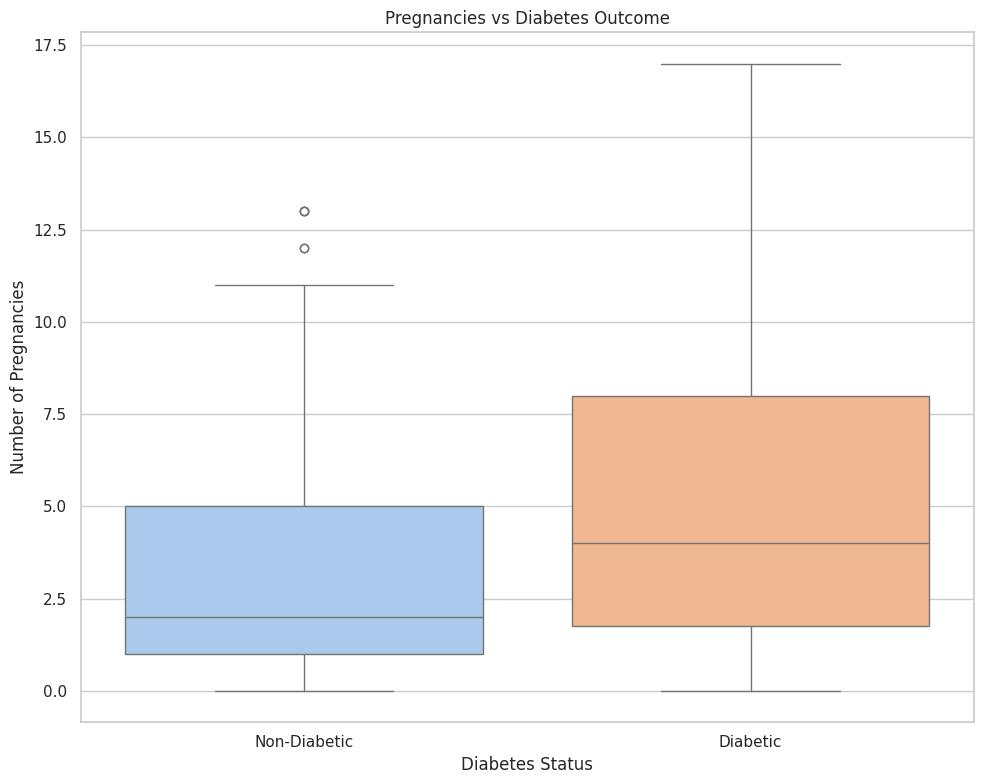

In [310]:
# Relationship between number of pregnancies and diabetes occurrence
plt.figure(figsize=(10, 8))
sns.boxplot(x='Outcome', y='Pregnancies', data=df, palette='pastel')
plt.title("Pregnancies vs Diabetes Outcome")
plt.xticks([0, 1], ['Non-Diabetic', 'Diabetic'])
plt.xlabel("Diabetes Status")
plt.ylabel("Number of Pregnancies")


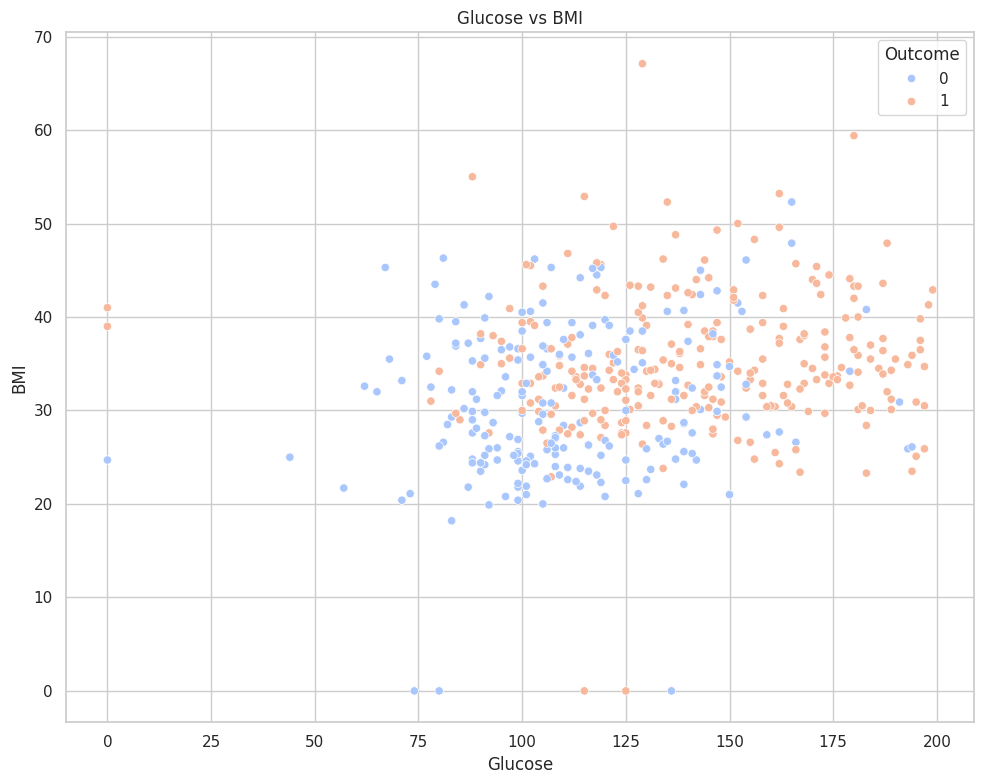

In [311]:
# Correlation between glucose levels and BMI
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Glucose', y='BMI', hue='Outcome', data=df, palette='coolwarm')
plt.title("Glucose vs BMI")
plt.xlabel("Glucose")
plt.ylabel("BMI")
plt.tight_layout()
plt.show()

from the boxplot of Pregnancies vs Diabetes Outcome, we saw that Diabetic patients tend to have a higher median number of pregnancies than non-diabetic patients and the range and outliers also show that some diabetic patients have significantly more pregnancies at the end, There is a positive association between the number of pregnancies and diabetes risk in this dataset.

# II. Data Pre-Processing

## (I) Data spliting and scaling

- **Spliting** dataframe for training, testing and validation
- **Scaling** the predictor to normalize the impact factor, since each predictor has a different degree of impact on the outcome
    \

In [232]:
def data_split(data):

    X = data.iloc[:,:-1]
    y = data.iloc[:,-1]

    train_x, test_x, train_y, test_y = train_test_split(X,y,test_size = 0.2, random_state=0)
    return train_x, test_x, train_y, test_y

def data_scaling(train_x, test_x):
    ss = StandardScaler()
    ss_model = ss.fit(train_x)
    train_x_scaled = ss_model.transform(train_x)
    test_x_scaled = ss_model.transform(test_x)
    return train_x_scaled, test_x_scaled


def data_scaling_plot(data):
    X = data.iloc[:,:-1].to_numpy()
    y = data.iloc[:,-1].to_numpy()
    ss = StandardScaler()
    ss_model = ss.fit(X)
    X_scaled = ss_model.transform(X)
    np_new = np.hstack((X_scaled, y.reshape(len(y),1)))
    column_headers = data.columns.values.tolist()
    df_new = pd.DataFrame(data = np_new, columns = column_headers)
    return df_new


## (II) Data balancing

### Check the number of each class

In [233]:
def check_num(df):
  print("Class 0:", (df.iloc[:,-1] == 0).sum())
  print("Class 1:", (df.iloc[:,-1] == 1).sum())

### Oversample

Oversample will not be used since it will introduced bias

In [234]:
def oversample(df):
  #create two different dataframe of majority and minority class
  if ((df.iloc[:,-1] == 0).sum()) >= ((df.iloc[:,-1] == 1).sum()):
    df_majority = df[(df.iloc[:,-1] == 0)]
    df_minority = df[(df.iloc[:,-1] == 1)]
    n_major = (df.iloc[:,-1] == 0).sum()
  else:
    df_majority = df[(df.iloc[:,-1] == 1)]
    df_minority = df[(df.iloc[:,-1] == 0)]
    n_major = (df.iloc[:,-1] == 1).sum()

  # oversample minority class
  df_minority_oversample = resample(df_minority,
                                  replace=True,
                                  n_samples= n_major,
                                  random_state=42)
  # Combine
  resample_df = pd.concat([df_minority_oversample, df_majority])

  # Shuffle
  resample_df = resample_df.sample(frac=1, random_state=0).reset_index(drop=True)

  return resample_df

### Undersample

In [235]:
def undersample(df):
  #create two different dataframe of majority and minority class
  if ((df.iloc[:,-1] == 0).sum()) >= ((df.iloc[:,-1] == 1).sum()):
    df_majority = df[(df.iloc[:,-1] == 0)]
    df_minority = df[(df.iloc[:,-1] == 1)]
    n_minor = (df.iloc[:,-1] == 1).sum()
  else:
    df_majority = df[(df.iloc[:,-1] == 1)]
    df_minority = df[(df.iloc[:,-1] == 0)]
    n_minor = (df.iloc[:,-1] == 0).sum()

  # oversample minority class
  df_majority_undersample = resample(df_majority,
                                  replace=True,
                                  n_samples= n_minor,
                                  random_state=42)
  # Combine
  resample_df = pd.concat([df_majority_undersample, df_minority])

  # Shuffle
  resample_df = resample_df.sample(frac=1, random_state=1).reset_index(drop=True)

  return resample_df

## (III) Data visualization

### 2D: PCA & t-SNE

In [236]:
def dim2(df, size, markersize):

  x = df.iloc[:,:-1].to_numpy()
  y = df.iloc[:,-1].to_numpy()

  ss = StandardScaler()
  ss_model = ss.fit(x)
  x_scaled = ss_model.transform(x)

# PCA
  pca = PCA(n_components=2)

  x_pca = pca.fit_transform(x_scaled)

  np_pca = np.hstack((x_pca, y.reshape(len(y),1)))

  column_pca = ['pc_0', 'pc_1', 'class']

  df_pca = pd.DataFrame(data = np_pca, columns = column_pca)


  df_0_pca = df_pca[(df_pca.iloc[:,-1] == 0)]
  df_1_pca = df_pca[(df_pca.iloc[:,-1] == 1)]
  x_0_pca = df_0_pca.iloc[:,:-1].to_numpy()
  x_1_pca = df_1_pca.iloc[:,:-1].to_numpy()

# t-SNE

  tsne = TSNE(n_components=2)

  x_tsne = tsne.fit_transform(x_scaled)

  np_tsne = np.hstack((x_tsne, y.reshape(len(y),1)))

  column_tsne = ['dim_0', 'dim_1', 'class']

  df_tsne = pd.DataFrame(data = np_tsne, columns = column_tsne)


  df_0_tsne = df_tsne[(df_tsne.iloc[:,-1] == 0)]
  df_1_tsne = df_tsne[(df_tsne.iloc[:,-1] == 1)]
  x_0_tsne = df_0_tsne.iloc[:,:-1].to_numpy()
  x_1_tsne = df_1_tsne.iloc[:,:-1].to_numpy()


#  plot

  fig = plt.figure(figsize = (16, 5))

  ax = plt.subplot(121)

  class_0_pca = ax.scatter(x_0_pca[:,0], x_0_pca[:,1], c='blue', s=size, alpha=0.3, label='Negative Cases')
  class_1_pca = ax.scatter(x_1_pca[:,0], x_1_pca[:,1], c='orange', s=size, alpha=0.3, label='Positive Cases')

  ax.legend(handles=[class_0_pca, class_1_pca] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')
  plt.title('PCA', size = 12)

  ax2 = plt.subplot(122)

  class_0_tsne = ax2.scatter(x_0_tsne[:,0], x_0_tsne[:,1], c='blue', s=size, alpha=0.3, label='Negative Cases')
  class_1_tsne = ax2.scatter(x_1_tsne[:,0], x_1_tsne[:,1], c='orange', s=size, alpha=0.3, label='Positive Cases')

  ax2.legend(handles=[class_0_tsne, class_1_tsne] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')
  plt.title('t-SNE', size = 12)


  plt.show()

### 2D: PCA only:

This served as a helper function for visualize the outcome of each classifier.

In [237]:
def pca_plot(test_x_scaled, test_y, test_y_pred, size, markersize):

  pca = PCA(n_components=2)

  x_pca = pca.fit_transform(test_x_scaled)

  true_np = np.hstack((x_pca, test_y.reshape(len(test_y),1)))

  pred_np = np.hstack((x_pca, test_y_pred.reshape(len(test_y_pred),1)))

  column_true = ['pc_0', 'pc_1', 'true']

  column_pred = ['pc_0', 'pc_1', 'pred']

  true_df = pd.DataFrame(data = true_np, columns = column_true)

  pred_df = pd.DataFrame(data = pred_np, columns = column_pred)

  true_df_0 = true_df[(true_df.iloc[:,-1] == 0)]
  true_df_1 = true_df[(true_df.iloc[:,-1] == 1)]
  true_x_0 = true_df_0.iloc[:,:-1].to_numpy()
  true_x_1 = true_df_1.iloc[:,:-1].to_numpy()

  pred_df_0 = pred_df[(pred_df.iloc[:,-1] == 0)]
  pred_df_1 = pred_df[(pred_df.iloc[:,-1] == 1)]
  pred_x_0 = pred_df_0.iloc[:,:-1].to_numpy()
  pred_x_1 = pred_df_1.iloc[:,:-1].to_numpy()

  join_df = true_df.join(pred_df["pred"])

  correct_df = join_df[(join_df.true == join_df.pred)]

  wrong_df = join_df[(join_df.true != join_df.pred)]

  correct_df_0 = correct_df[(correct_df.iloc[:,-2] == 0)]
  correct_df_1 = correct_df[(correct_df.iloc[:,-2] == 1)]
  correct_x_0 = correct_df_0.iloc[:,:-2].to_numpy()
  correct_x_1 = correct_df_1.iloc[:,:-2].to_numpy()

  fn_df = wrong_df[(wrong_df.iloc[:,-1] == 0)]
  fp_df = wrong_df[(wrong_df.iloc[:,-1] == 1)]
  fn_x = fn_df.iloc[:,:-2].to_numpy()
  fp_x = fp_df.iloc[:,:-2].to_numpy()



# plot


  fig = plt.figure(figsize = (24, 5))

  ax1 = plt.subplot(131)


  true_class_0 = ax1.scatter(true_x_0[:,0], true_x_0[:,1], c='blue', s=size, alpha=0.3, label='Negative Cases')
  true_class_1 = ax1.scatter(true_x_1[:,0], true_x_1[:,1], c='orange', s=size, alpha=0.3, label='Positive Cases')

  ax1.legend(handles=[true_class_0, true_class_1] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')
  plt.title('Ground Truth of Test Data', size = 12)

  ax2 = plt.subplot(132)


  pred_class_0 = ax2.scatter(pred_x_0[:,0], pred_x_0[:,1], c='blue', s=size, alpha=0.3, label='Negative Cases')
  pred_class_1 = ax2.scatter(pred_x_1[:,0], pred_x_1[:,1], c='orange', s=size, alpha=0.3, label='Positive Cases')

  ax2.legend(handles=[pred_class_0, pred_class_1] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')
  plt.title('Prediction', size = 12)


  ax3 = plt.subplot(133)

  correct_class_0 = ax3.scatter(correct_x_0[:,0], correct_x_0[:,1], c='blue', s=size, alpha=0.3, label='True Negative')
  correct_class_1 = ax3.scatter(correct_x_1[:,0], correct_x_1[:,1], c='orange', s=size, alpha=0.3, label='True Positive')
  fn_class = ax3.scatter(fn_x[:,0], fn_x[:,1], c='green', s=size, alpha=0.3, label='False Negative')
  fp_class = ax3.scatter(fp_x[:,0], fp_x[:,1], c='red', s=size, alpha=0.3, label='False Positive')
  ax3.legend(handles=[correct_class_0, correct_class_1, fn_class, fp_class] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')

  plt.title('Comparison', size = 12)











### 3D: PCA

In [238]:
def dim3(df, size, markersize):
  x = df.iloc[:,:-1].to_numpy()
  y = df.iloc[:,-1].to_numpy()

  ss = StandardScaler()
  ss_model = ss.fit(x)
  x_scaled = ss_model.transform(x)

  pca_1 = PCA(n_components = 3).fit(x_scaled)

  Xt = pca_1.transform(x_scaled)

  new_np = np.hstack((Xt, y.reshape(len(y),1)))

  column_values = ['pc_0', 'pc_1', 'pc_2', 'class']

  new_df = pd.DataFrame(data = new_np, columns = column_values)


  df_0 = new_df[(new_df.iloc[:,-1] == 0)]
  df_1 = new_df[(new_df.iloc[:,-1] == 1)]
  x_0 = df_0.iloc[:,:-1].to_numpy()
  y_0 = df_0.iloc[:,-1].to_numpy()
  x_1 = df_1.iloc[:,:-1].to_numpy()
  y_1 = df_1.iloc[:,-1].to_numpy()


  fig = plt.figure(figsize = (16, 5))

  ax = plt.subplot(121, projection ="3d")
  class_0 = ax.scatter3D(x_0[:,0], x_0[:,1], x_0[:,2], c='blue', s=size, alpha=0.3, label='Negative Cases')
  class_1 = ax.scatter3D(x_1[:,0], x_1[:,1], x_1[:,2], c='orange', s=size, alpha=0.3, label='Positive Cases')
  ax.legend(handles=[class_0, class_1] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')


  ax_2 = plt.subplot(122, projection ="3d")
  class_0_2 = ax_2.scatter3D(x_0[:,1], x_0[:,0], x_0[:,2], c='blue', s=size, alpha=0.3, label='Negative Cases')
  class_1_2 = ax_2.scatter3D(x_1[:,1], x_1[:,0], x_1[:,2], c='orange', s=size, alpha=0.3, label='Positive Cases')
  ax_2.legend(handles=[class_0, class_1] , markerscale=markersize, loc = 'best',
            frameon = True, facecolor = 'white', edgecolor = 'black')

  plt.show()



###  Check Nulls

In [239]:
# drop NaN value
print("Any null value:", any(df.isnull()))
print("Any NaN value:", any(df.isna()))
print("Before Droping NaN Number of Rows:", len(df))

df = df.dropna()
print("After Droping NaN Number of Rows:", len(df))

df.tail()

Any null value: True
Any NaN value: True
Before Droping NaN Number of Rows: 768
After Droping NaN Number of Rows: 768


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


---
### 1.0.2 Data Balance

In [240]:
check_num(df)

Class 0: 500
Class 1: 268


Undersample

In [241]:
df = undersample(df)
check_num(df)

Class 0: 268
Class 1: 268


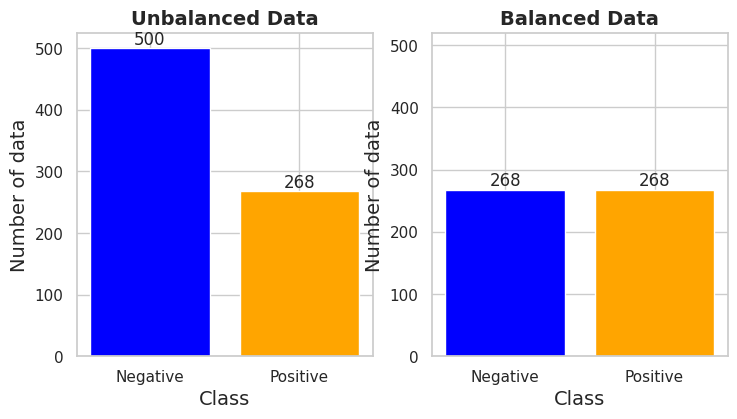

In [242]:
plt.figure(figsize = (8.4, 4.2))

plt.subplot(1, 2, 1)
x = ["Negative", "Positive"]
h = [500,268]
c = ['blue', 'orange']
bars = plt.bar(x, height = h, color = c)
plt.bar_label(bars)
plt.xlabel("Class", size=14)
plt.ylabel("Number of data", size=14)
plt.title("Unbalanced Data", size=14, fontweight='bold')


plt.subplot(1, 2, 2)
x = ["Negative", "Positive"]
h = [268,268]
c = ['blue', 'orange']
bars = plt.bar(x, height = h, color = c)
plt.bar_label(bars)
plt.ylim(0, 520)
plt.xlabel("Class", size=14)
plt.ylabel("Number of data", size=14)
plt.title("Balanced Data", size=14, fontweight='bold')


plt.show()

### 1.0.3 Data Scaling

Before Scaling

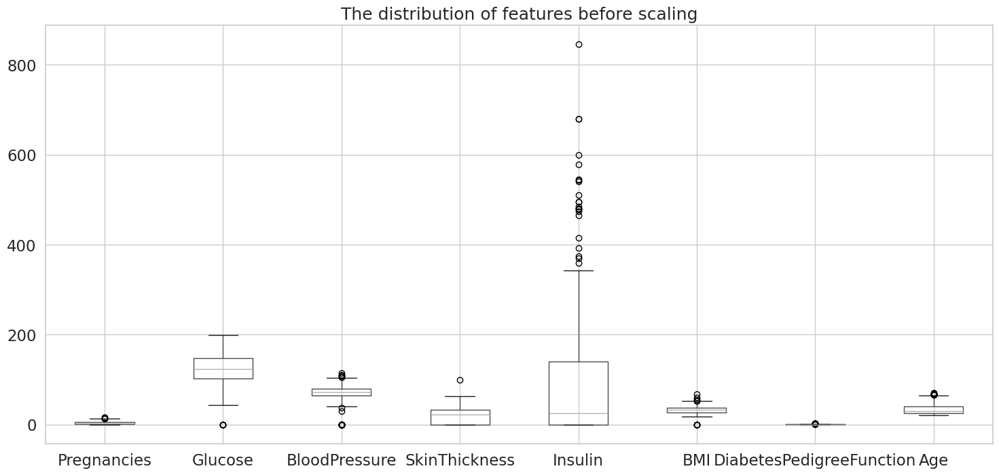

In [243]:
plt.figure(figsize=[18,8])
with sns.plotting_context("notebook",font_scale=1.5):
  df.boxplot(column=df.columns.values.tolist()[:-1])
  plt.title("The distribution of features before scaling")

After scaling

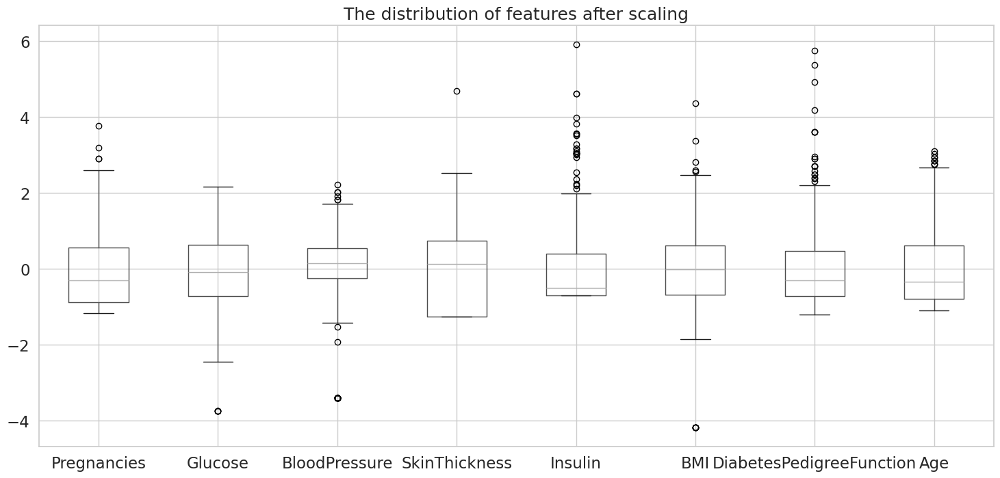

In [244]:
plt.figure(figsize=[18,8])
with sns.plotting_context("notebook",font_scale=1.5):
  data_scaling_plot(df).boxplot(column=df.columns.values.tolist()[:-1])
  plt.title("The distribution of features after scaling")

### 1.0.4 Data Visualization


#### 1.0.4.1 Visualization in 2D

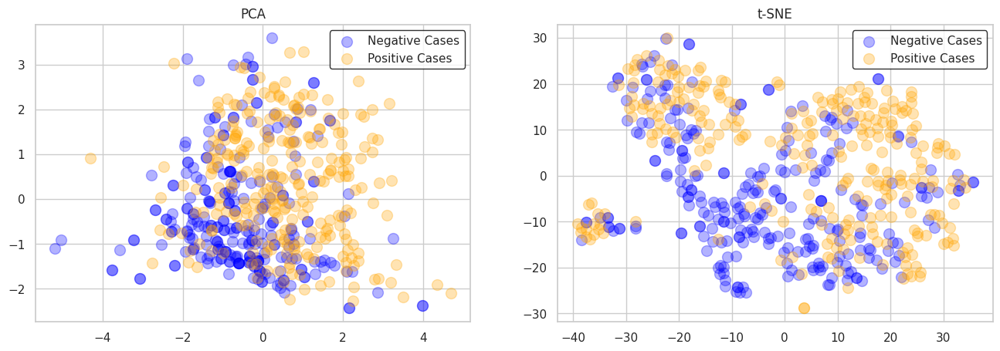

In [245]:
dim2(df, 100, 1)

In [246]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,9,184,85,15,0,30.0,1.213,49,1
1,0,138,60,35,167,34.6,0.534,21,1
2,6,166,74,0,0,26.6,0.304,66,0
3,0,95,85,25,36,37.4,0.247,24,1
4,0,131,0,0,0,43.2,0.270,26,1
...,...,...,...,...,...,...,...,...,...
531,0,125,96,0,0,22.5,0.262,21,0
532,5,104,74,0,0,28.8,0.153,48,0
533,3,116,74,15,105,26.3,0.107,24,0
534,1,135,54,0,0,26.7,0.687,62,0


In [247]:
df['Outcome'].unique()


array([1, 0])

In [248]:
X=df.drop('Outcome',axis=1)
y=df['Outcome']

# Feature Selection Techniques

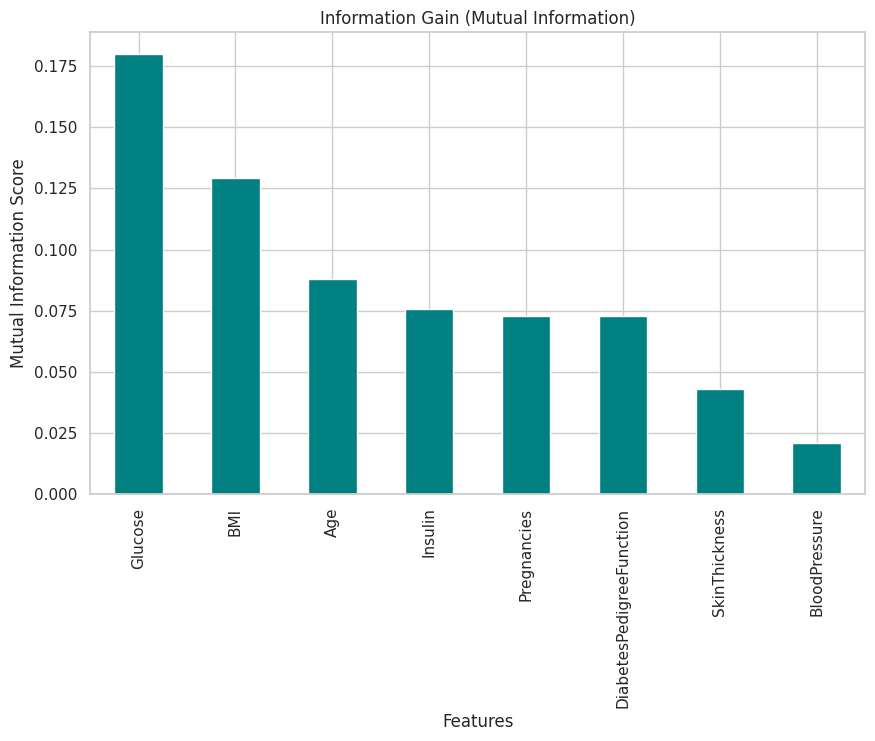

In [249]:
mi_scores = mutual_info_classif(X, y)
mi_scores = pd.Series(mi_scores, index=X.columns)
mi_scores.sort_values(ascending=False, inplace=True)

# plot information gain
plt.figure(figsize=(10, 6))
mi_scores.plot(kind="bar", color="teal")
plt.title("Information Gain (Mutual Information)")
plt.xlabel("Features")
plt.ylabel("Mutual Information Score")
plt.show()

###
#  Chi-square scores

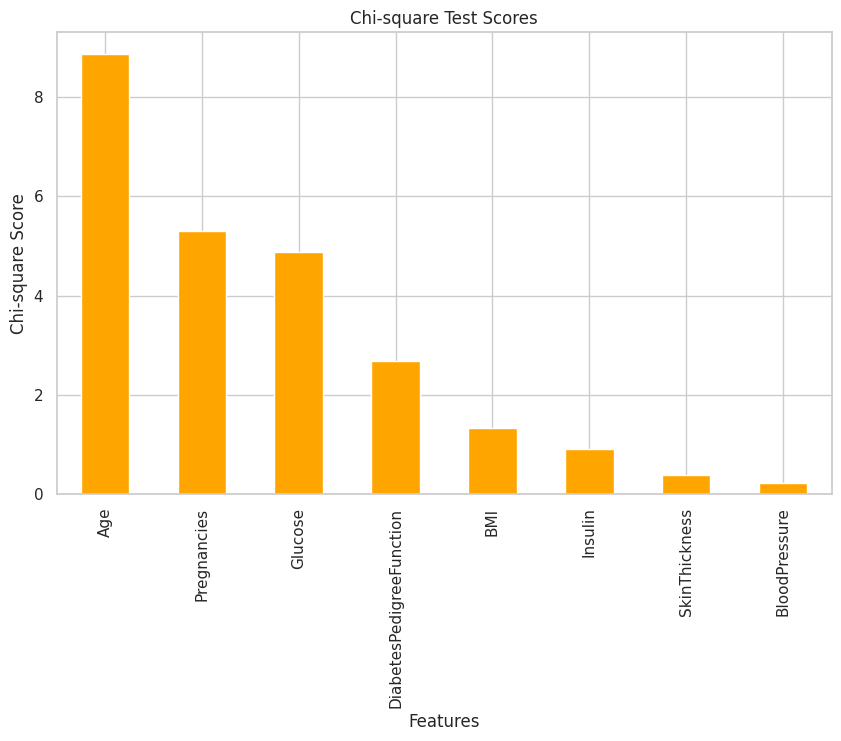

In [250]:
minmax_scaler = MinMaxScaler()
X_non_negative = minmax_scaler.fit_transform(X)

y_bin = np.where(y > np.median(y), 1, 0)  # convert to binary classification

chi2_scores, _ = chi2(X_non_negative, y_bin)
chi2_scores = pd.Series(chi2_scores, index=X.columns)
chi2_scores.sort_values(ascending=False, inplace=True)

# plot Chi-square Scores
plt.figure(figsize=(10, 6))
chi2_scores.plot(kind="bar", color="orange")
plt.title("Chi-square Test Scores")
plt.xlabel("Features")
plt.ylabel("Chi-square Score")
plt.show()


#  Fisher Score

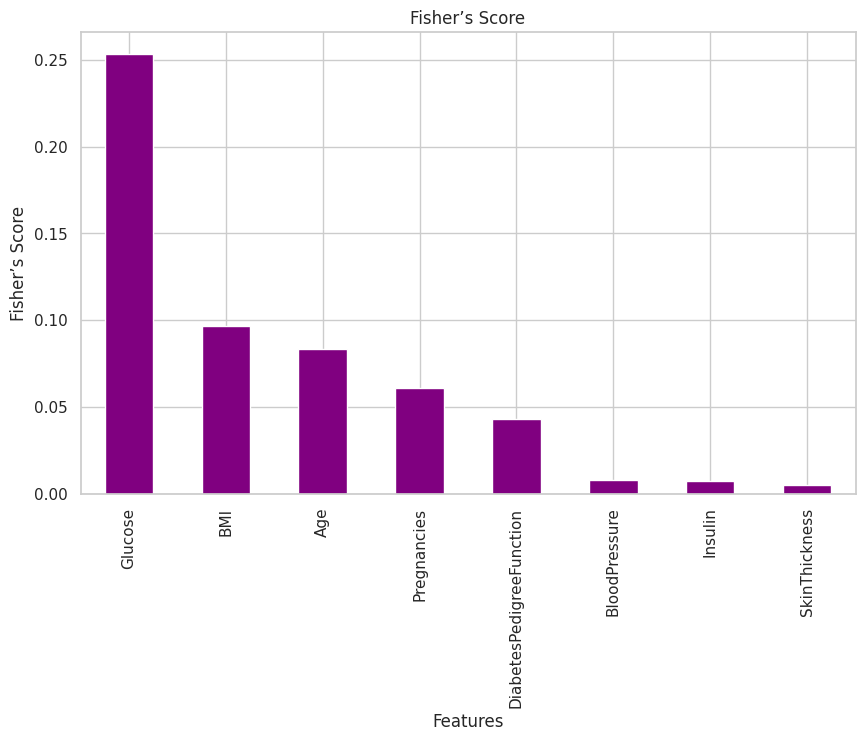

In [251]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# scale the features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# use original y if already binary, otherwise binarize
if len(np.unique(y)) == 2:
    y_bin = y
else:
    y_bin = np.where(y > np.median(y), 1, 0)

def fisher_score(X, y):
    classes = np.unique(y)
    overall_mean = np.mean(X, axis=0)
    between_var = np.zeros(X.shape[1])
    within_var = np.zeros(X.shape[1])

    for c in classes:
        X_c = X[y == c]
        mean_c = np.mean(X_c, axis=0)
        n_c = X_c.shape[0]

        between_var += n_c * (mean_c - overall_mean) ** 2
        within_var += np.sum((X_c - mean_c) ** 2, axis=0)

    fisher_scores = between_var / within_var
    return fisher_scores

fisher_scores = fisher_score(X_scaled, y_bin)
fisher_scores = pd.Series(fisher_scores, index=X.columns)
fisher_scores.sort_values(ascending=False, inplace=True)

# plot Fisher’s Scores
plt.figure(figsize=(10, 6))
fisher_scores.plot(kind="bar", color="purple")
plt.title("Fisher’s Score")
plt.xlabel("Features")
plt.ylabel("Fisher’s Score")
plt.show()


# correlation Coefficient

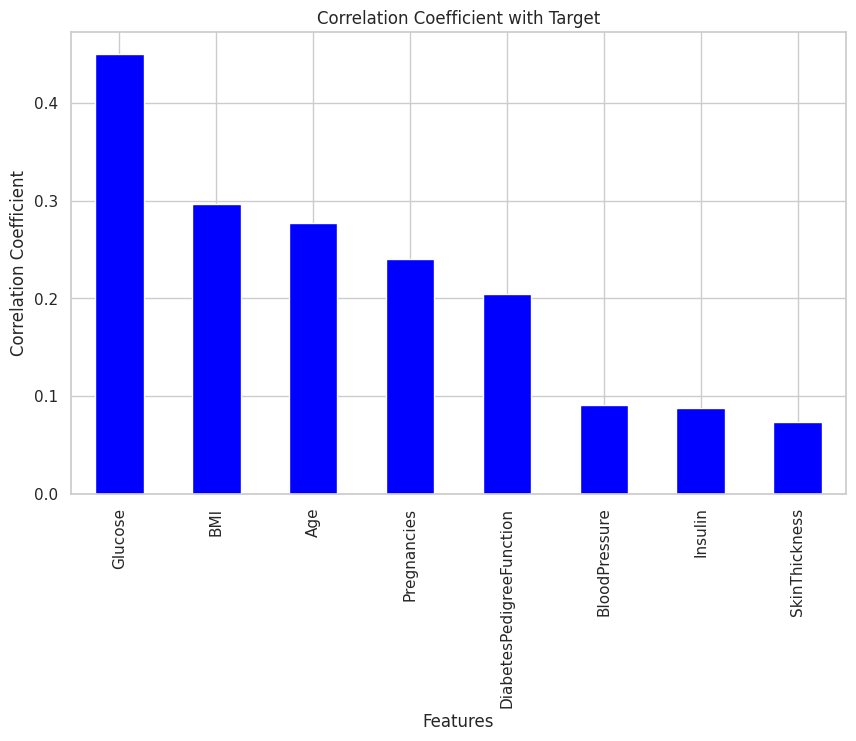

In [252]:
corr_scores = np.corrcoef(X.T, y)[-1, :-1]  # Correlation with target
corr_scores = pd.Series(corr_scores, index= X.columns)
corr_scores.sort_values(ascending=False, inplace=True)

# plot Correlation Coefficients
plt.figure(figsize=(10, 6))
corr_scores.plot(kind="bar", color="blue")
plt.title("Correlation Coefficient with Target")
plt.xlabel("Features")
plt.ylabel("Correlation Coefficient")
plt.show()

In [253]:
# variance Threshold
variance_threshold = VarianceThreshold(threshold=0.1)  # remove low-variance features
X_variance_selected = variance_threshold.fit_transform(X)

# selected features
selected_features = variance_threshold.get_support(indices=True)
print("Selected Features (Variance Threshold):", [X.columns[i] for i in selected_features])

Selected Features (Variance Threshold): ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


# ANOVA (F-test)

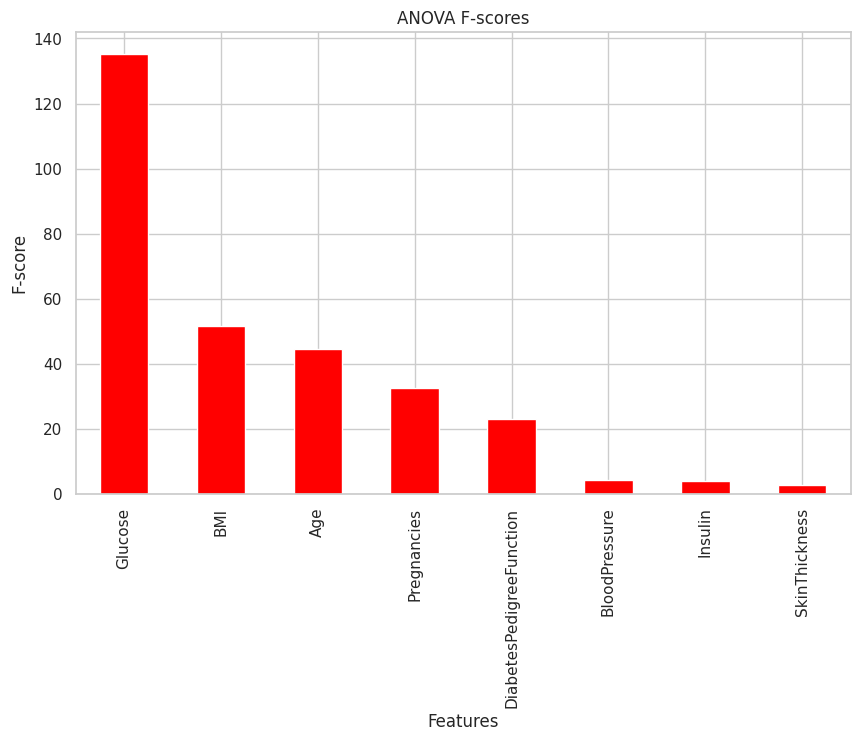

In [254]:

f_scores, _ = f_classif(X, y)  # ANOVA F-test
f_scores = pd.Series(f_scores, index=X.columns)
f_scores.sort_values(ascending=False, inplace=True)

# plot ANOVA F-scores
plt.figure(figsize=(10, 6))
f_scores.plot(kind="bar", color="red")
plt.title("ANOVA F-scores")
plt.xlabel("Features")
plt.ylabel("F-score")
plt.show()

#relief

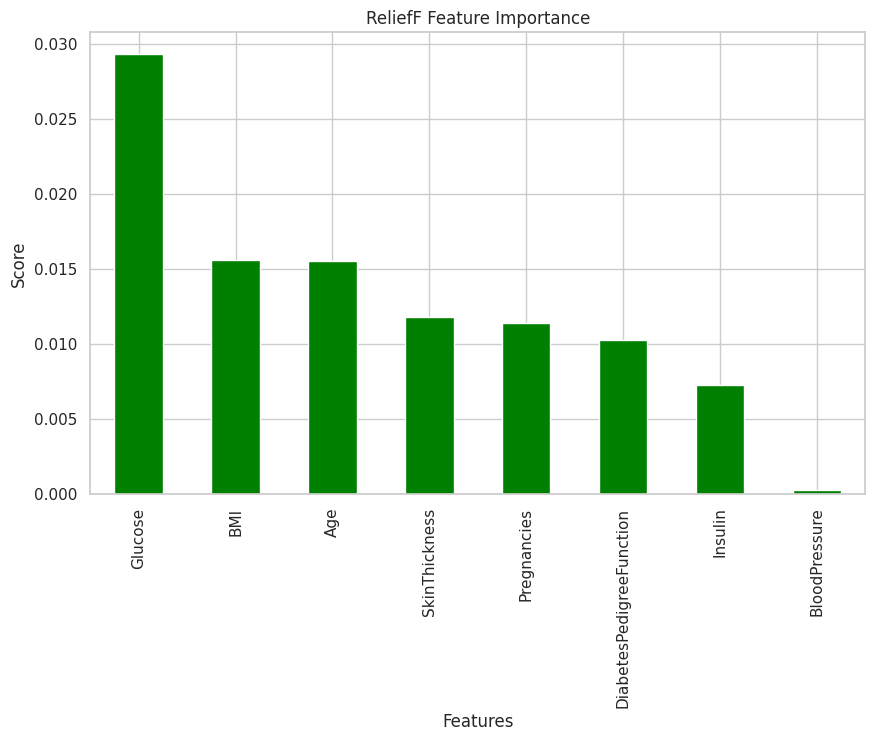

In [255]:
relief = ReliefF(n_neighbors=20)
relief.fit(X.values, y.values)

scores = pd.Series(relief.feature_importances_, index=X.columns)
scores.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
scores.plot(kind='bar', color='green')
plt.title('ReliefF Feature Importance')
plt.ylabel('Score')
plt.xlabel('Features')
plt.show()


In [256]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

#exhaustive Feature selection

In [257]:

efs = EFS(
    estimator=RandomForestClassifier(
    n_estimators=3,
    random_state=0),
    min_features=1,
    max_features=7,
    scoring='roc_auc',
    cv=2,
)
efs = efs.fit(X_train, y_train)
efs.best_feature_names_

Features: 254/254

('Pregnancies',
 'Glucose',
 'SkinThickness',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age')

#Forward selection

In [258]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS

In [259]:
FS = SFS(
    estimator=RandomForestClassifier(n_estimators=5, random_state=0),
    n_features_to_select=7,
    tol=0.001,
    direction='forward',
    scoring='roc_auc',
    cv=3,
)
FS = FS.fit(X_train, y_train)
FS.get_feature_names_out()



array(['Pregnancies', 'Glucose', 'SkinThickness', 'Insulin', 'BMI',
       'DiabetesPedigreeFunction', 'Age'], dtype=object)

#Backward Selection

In [260]:

BS = SFS(
    estimator = RandomForestClassifier(n_estimators=5, random_state=10),
    n_features_to_select=7,
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
)
BS = BS.fit(X_train, y_train)
BS.get_feature_names_out()

array(['Pregnancies', 'Glucose', 'BloodPressure', 'Insulin', 'BMI',
       'DiabetesPedigreeFunction', 'Age'], dtype=object)

#RFE

In [261]:

from sklearn.feature_selection import RFE

selector = RFE(estimator=RandomForestClassifier(), n_features_to_select=5, step=1)
selector = selector.fit(X, y)
selected_features = X.columns[selector.support_]
print("Selected Features:", selected_features)

Selected Features: Index(['Glucose', 'BloodPressure', 'BMI', 'DiabetesPedigreeFunction', 'Age'], dtype='object')


#voting betwen all algorithms

**After performing feature selection and applying a voting mechanism across different algorithms, we identified the top 7 features out of 9 as the most important. However, we observed that the remaining 2 features are not significantly less important than the top 7. In fact, they also hold valuable information. Considering that the total number of features is already small (only 9), and each feature contributes meaningfully to the results, we decided to include all 9 features when applying the models.**

#voting betwen all algorithms

In [262]:
votes = {}

for feature, score in mi_scores.items():
    votes[feature] = votes.get(feature, 0) + 1 if score > 0 else votes.get(feature, 0)

for feature, score in chi2_scores.items():
    votes[feature] = votes.get(feature, 0) + 1 if score > 0 else votes.get(feature, 0)

for feature, score in fisher_scores.items():
    votes[feature] = votes.get(feature, 0) + 1 if score > 0 else votes.get(feature, 0)

for feature, score in f_scores.items():
    votes[feature] = votes.get(feature, 0) + 1 if score > 0 else votes.get(feature, 0)

for feature, score in scores.items():
    votes[feature] = votes.get(feature, 0) + 1 if score > 0 else votes.get(feature, 0)

for feature in efs.best_feature_names_:
    votes[feature] = votes.get(feature, 0) + 1

for feature in FS.get_feature_names_out():
    votes[feature] = votes.get(feature, 0) + 1

for feature in BS.get_feature_names_out():
    votes[feature] = votes.get(feature, 0) + 1

for feature in selected_features:
    votes[feature] = votes.get(feature, 0) + 1

sorted_votes = sorted(votes.items(), key=lambda x: x[1], reverse=True)

top_7_features = [feature for feature, _ in sorted_votes[:7]]

print("Top 7 Selected Features:", top_7_features)


Top 7 Selected Features: ['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'Insulin', 'SkinThickness']


**After performing feature selection and applying a voting mechanism across different algorithms, we identified the top 7 features out of 9 as the most important. However, we observed that the remaining 2 features are not significantly less important than the top 7. In fact, they also hold valuable information. Considering that the total number of features is already small (only 9), and each feature contributes meaningfully to the results, we decided to include all 9 features when applying the models.**

# Models

# With Selected Features

## SVM + K-Fold Cross Validation

In [263]:
top_7_features = ['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction',
                 'Pregnancies', 'Insulin', 'BloodPressure']
selected_features = top_7_features + ['Outcome']

In [264]:
df_selected = df[selected_features]

In [265]:
train_x_sel, test_x_sel, train_y_sel, test_y_sel = data_split(df_selected)
train_x_scaled, test_x_scaled = data_scaling(train_x_sel, test_x_sel)

In [266]:
svm_model = SVC(kernel='linear', probability=True)

cv_result = cross_validate(svm_model, train_x_scaled, train_y_sel, cv=5 ,scoring='accuracy',n_jobs=-1, return_train_score = True)
train_score = np.mean(cv_result['train_score'])
val_score = np.mean(cv_result['test_score'])


In [267]:
svm_model.fit(train_x_scaled, train_y_sel)

SVC(kernel='linear', probability=True)

In [268]:
test_y_pred = svm_model.predict(test_x_scaled)


In [269]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(test_y_sel, test_y_pred).ravel()

In [270]:
print("Training Accuracy:", svm_model.score(train_x_scaled, train_y_sel))
print("CV Training Accuracy:", train_score)
print("Validation Score", val_score)
print("Testing Accuracy:", svm_model.score(test_x_scaled, test_y_sel))
print("Testing: Sensitivity:", true_positive/(true_positive+false_negative), "Specificity:", true_negative/(true_negative+false_positive))

Training Accuracy: 0.7429906542056075
CV Training Accuracy: 0.7476633761273932
Validation Score 0.7289740082079342
Testing Accuracy: 0.7685185185185185
Testing: Sensitivity: 0.7777777777777778 Specificity: 0.7592592592592593


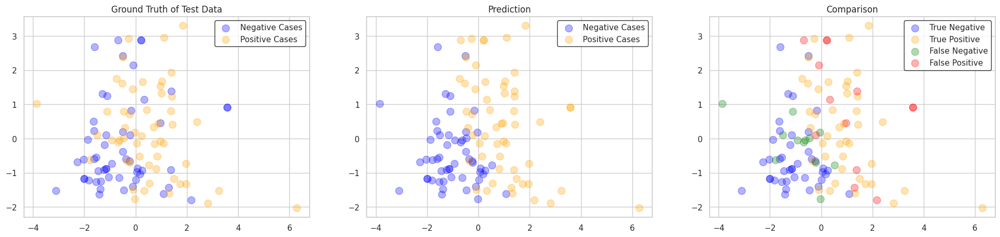

In [271]:
pca_plot(test_x_scaled, test_y_sel.to_numpy(), test_y_pred, 100, 1)


In [272]:
train_x_sel_df = pd.DataFrame(train_x_scaled, columns=train_x_sel.columns)
test_x_sel_df = pd.DataFrame(test_x_scaled, columns=train_x_sel.columns)


# LIME

In [273]:
# LIME explainer on selected features
lime_explainer_sel = lime_tabular.LimeTabularExplainer(
    training_data=train_x_sel_df.values,
    feature_names=train_x_sel_df.columns.tolist(),
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

# Explain a sample instance
lime_exp_sel = lime_explainer_sel.explain_instance(
    data_row=test_x_sel_df.iloc[5].values,
    predict_fn=svm_model.predict_proba,
    num_features=7
)

# Show in notebook
lime_exp_sel.show_in_notebook(show_table=True)

# Permutation Feature Importance

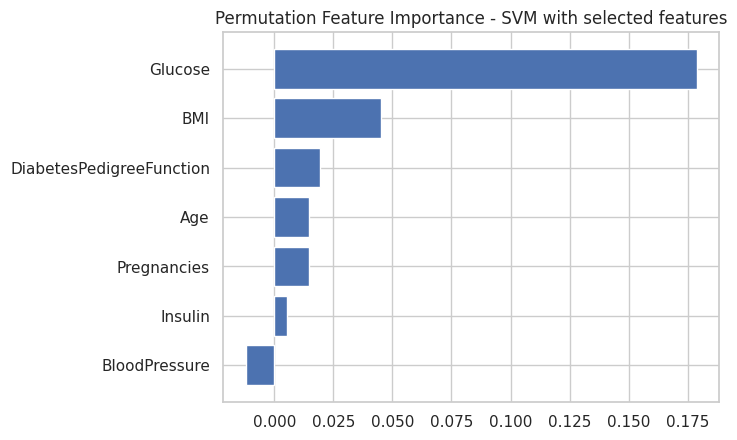

In [274]:
from sklearn.inspection import permutation_importance

result = permutation_importance(svm_model, test_x_scaled, test_y_sel, n_repeats=10, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.barh(test_x_sel_df.columns[sorted_idx], result.importances_mean[sorted_idx])
plt.title("Permutation Feature Importance - SVM with selected features")
plt.show()

# Global Surrogate Tree

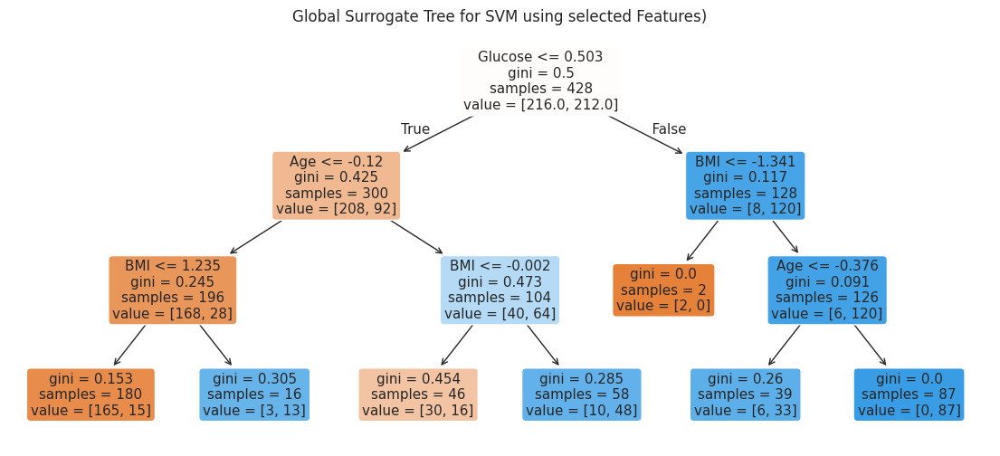

In [275]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import matplotlib.pyplot as plt

preds = svm_model.predict(train_x_scaled)
surrogate = DecisionTreeClassifier(max_depth=3, random_state=42)
surrogate.fit(train_x_scaled, preds)

plt.figure(figsize=(14, 6))
tree.plot_tree(surrogate, feature_names=train_x_sel_df.columns, filled=True, rounded=True)
plt.title(f"Global Surrogate Tree for SVM using selected Features)")
plt.show()


## Random Forest + K-Fold Cross Validation



In [276]:
random_forest_model = RandomForestClassifier(max_depth=2, random_state=0)
cv_result = cross_validate(random_forest_model, train_x_scaled, train_y_sel, cv=5 ,scoring='accuracy',n_jobs=-1, return_train_score = True)
train_score = np.mean(cv_result['train_score'])
val_score = np.mean(cv_result['test_score'])



In [277]:
random_forest_model.fit(train_x_scaled, train_y_sel)

RandomForestClassifier(max_depth=2, random_state=0)

In [278]:
test_y_pred = random_forest_model.predict(test_x_scaled)


In [279]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(test_y_sel, test_y_pred).ravel()

In [280]:
print("Training Accuracy:", random_forest_model.score(train_x_scaled, train_y_sel))
print("CV Training Accuracy:", train_score)
print("Validation Score", val_score)
print("Testing Accuracy:", random_forest_model.score(test_x_scaled, test_y_sel))
print("Testing: Sensitivity:", true_positive/(true_positive+false_negative), "Specificity:", true_negative/(true_negative+false_positive))

Training Accuracy: 0.7827102803738317
CV Training Accuracy: 0.7902988764428077
Validation Score 0.7477154582763338
Testing Accuracy: 0.7685185185185185
Testing: Sensitivity: 0.9074074074074074 Specificity: 0.6296296296296297


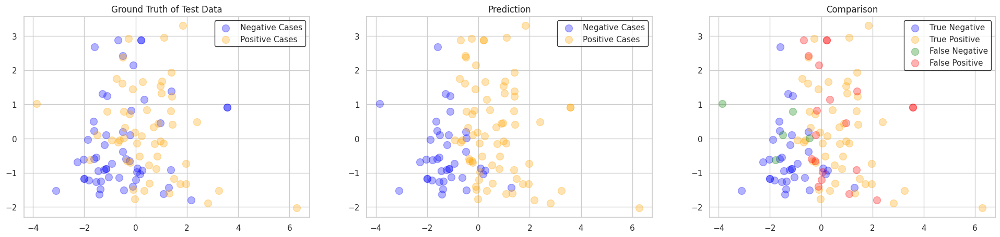

In [281]:
pca_plot(test_x_scaled, test_y_sel.to_numpy(), test_y_pred, 100, 1)


# LIME

In [282]:
# LIME Explainer
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=train_x_sel_df.values,
    feature_names=train_x_sel_df.columns.tolist(),
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

# Explain one test instance
lime_exp = lime_explainer.explain_instance(
    data_row=test_x_sel_df.iloc[5].values,
    predict_fn=random_forest_model.predict_proba
)

# Show LIME explanation
lime_exp.show_in_notebook(show_table=True)

# Permutation Feature Importance

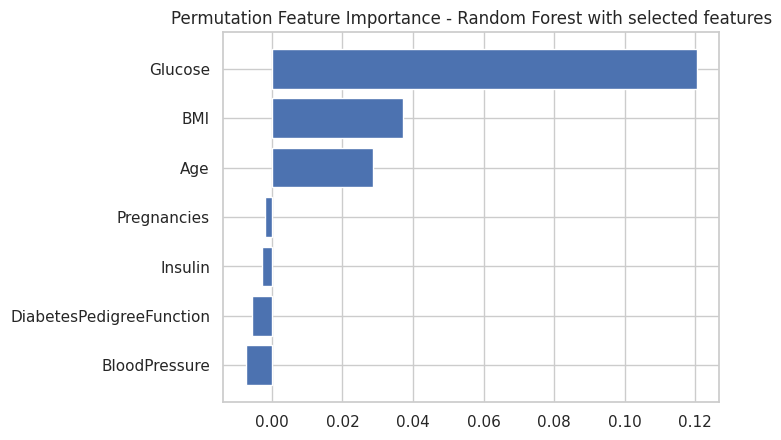

In [283]:
from sklearn.inspection import permutation_importance

result = permutation_importance(random_forest_model, test_x_scaled, test_y_sel, n_repeats=10, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.barh(test_x_sel_df.columns[sorted_idx], result.importances_mean[sorted_idx])
plt.title("Permutation Feature Importance - Random Forest with selected features")
plt.show()

# Global Surrogate Tree

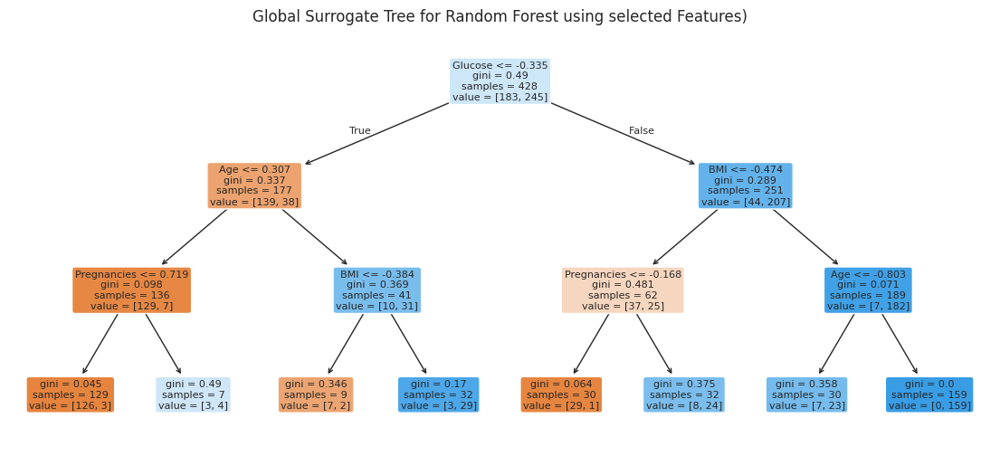

In [284]:
preds = random_forest_model.predict(train_x_scaled)
surrogate = DecisionTreeClassifier(max_depth=3, random_state=42)
surrogate.fit(train_x_scaled, preds)

plt.figure(figsize=(14, 6))
tree.plot_tree(surrogate, feature_names=train_x_sel_df.columns, filled=True, rounded=True)
plt.title(f"Global Surrogate Tree for Random Forest using selected Features)")
plt.show()


# Models with All Features

## SVM + K-Fold Cross Validation

In [315]:
x_train, x_test, y_train, y_test = data_split(df)
train_x_scaled, test_x_scaled = data_scaling(x_train, x_test)

In [316]:
svm_model_2 = SVC(kernel='linear', probability=True)

cv_result = cross_validate(svm_model_2, train_x_scaled, y_train, cv=5 ,scoring='accuracy',n_jobs=-1, return_train_score = True)
train_score = np.mean(cv_result['train_score'])
val_score = np.mean(cv_result['test_score'])


In [317]:
svm_model_2.fit(train_x_scaled, y_train)

SVC(kernel='linear', probability=True)

In [318]:
test_y_pred = svm_model_2.predict(test_x_scaled)


In [319]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(y_test, test_y_pred).ravel()

In [320]:
print("Training Accuracy:", svm_model_2.score(train_x_scaled, y_train))
print("CV Training Accuracy:", train_score)
print("Validation Score", val_score)
print("Testing Accuracy:", svm_model_2.score(test_x_scaled, y_test))
print("Testing: Sensitivity:", true_positive/(true_positive+false_negative), "Specificity:", true_negative/(true_negative+false_positive))

Training Accuracy: 0.75
CV Training Accuracy: 0.7459141049903669
Validation Score 0.7265663474692202
Testing Accuracy: 0.7870370370370371
Testing: Sensitivity: 0.7962962962962963 Specificity: 0.7777777777777778


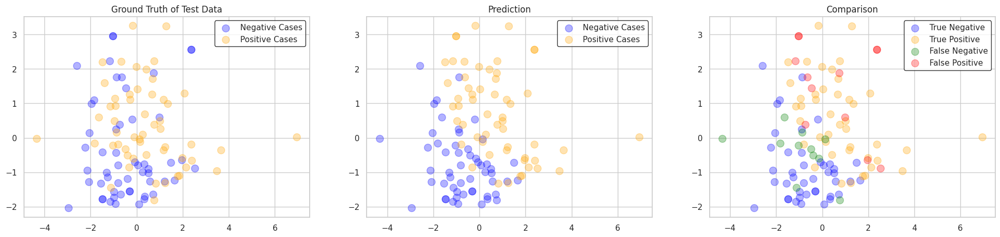

In [321]:
pca_plot(test_x_scaled, y_test.to_numpy(), test_y_pred, 100, 1)


In [322]:
from lime import lime_tabular

train_x_scaled_df = pd.DataFrame(train_x_scaled, columns=x_train.columns)
test_x_scaled_df = pd.DataFrame(test_x_scaled, columns=x_train.columns)




# LIME

In [323]:
# LIME Explainer
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=train_x_scaled_df.values,
    feature_names=train_x_scaled_df.columns.tolist(),
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

# Explain one test instance
lime_exp = lime_explainer.explain_instance(
    data_row=test_x_scaled_df.iloc[5].values,
    predict_fn=svm_model_2.predict_proba
)

# Show LIME explanation
lime_exp.show_in_notebook(show_table=True)

# Permutation Feature Importance

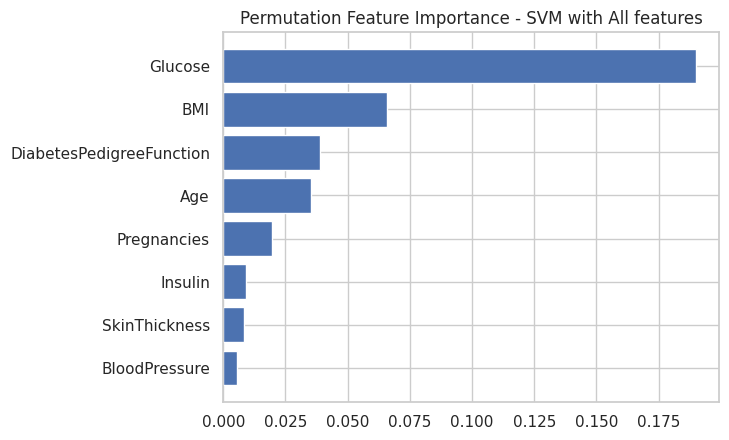

In [324]:
from sklearn.inspection import permutation_importance

result = permutation_importance(svm_model_2, test_x_scaled, y_test, n_repeats=10, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.barh(test_x_scaled_df.columns[sorted_idx], result.importances_mean[sorted_idx])
plt.title("Permutation Feature Importance - SVM with All features")
plt.show()

# Global Surrogate Tree

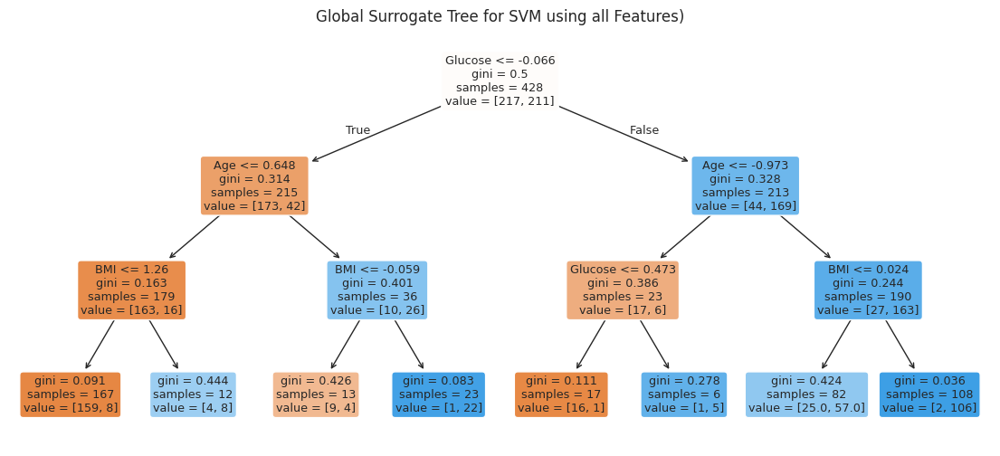

In [325]:
preds = svm_model_2.predict(train_x_scaled)
surrogate = DecisionTreeClassifier(max_depth=3, random_state=42)
surrogate.fit(train_x_scaled, preds)

plt.figure(figsize=(14, 6))
tree.plot_tree(surrogate, feature_names=train_x_scaled_df.columns, filled=True, rounded=True)
plt.title(f"Global Surrogate Tree for SVM using all Features)")
plt.show()


## Random Forest + K-Fold Cross Validation


In [326]:
random_forest_model_2 = RandomForestClassifier(max_depth=2, random_state=0)
cv_result = cross_validate(random_forest_model_2, train_x_scaled, y_train, cv=5 ,scoring='accuracy',n_jobs=-1, return_train_score = True)
train_score = np.mean(cv_result['train_score'])
val_score = np.mean(cv_result['test_score'])



In [327]:
random_forest_model_2.fit(train_x_scaled, y_train)

RandomForestClassifier(max_depth=2, random_state=0)

In [328]:
test_y_pred = random_forest_model_2.predict(test_x_scaled)


In [329]:
true_negative, false_positive, false_negative, true_positive = confusion_matrix(y_test, test_y_pred).ravel()

In [300]:
print("Training Accuracy:", random_forest_model_2.score(train_x_scaled, y_train))
print("CV Training Accuracy:", train_score)
print("Validation Score", val_score)
print("Testing Accuracy:", random_forest_model_2.score(test_x_scaled, y_test))
print("Testing: Sensitivity:", true_positive/(true_positive+false_negative), "Specificity:", true_negative/(true_negative+false_positive))

Training Accuracy: 0.7897196261682243
CV Training Accuracy: 0.783289857296302
Validation Score 0.7431190150478797
Testing Accuracy: 0.7407407407407407
Testing: Sensitivity: 0.8518518518518519 Specificity: 0.6296296296296297


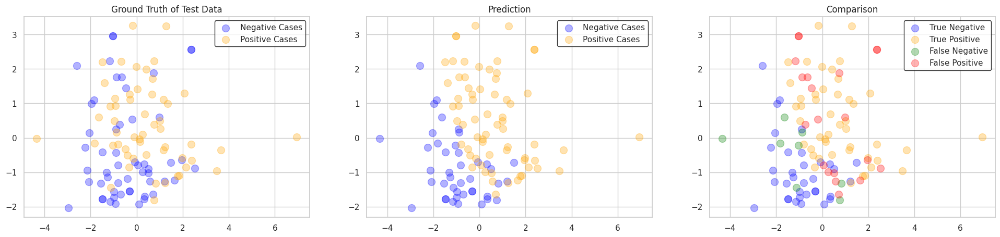

In [301]:
pca_plot(test_x_scaled, test_y_sel.to_numpy(), test_y_pred, 100, 1)


In [302]:
from lime import lime_tabular

train_x_scaled_df = pd.DataFrame(train_x_scaled, columns=x_train.columns)
test_x_scaled_df = pd.DataFrame(test_x_scaled, columns=x_train.columns)




# LIME

In [303]:
# LIME Explainer
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=train_x_scaled_df.values,
    feature_names=train_x_scaled_df.columns.tolist(),
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

# Explain one test instance
lime_exp = lime_explainer.explain_instance(
    data_row=test_x_scaled_df.iloc[5].values,
    predict_fn=random_forest_model_2.predict_proba
)

# Show LIME explanation
lime_exp.show_in_notebook(show_table=True)

# Permutation Feature Importance

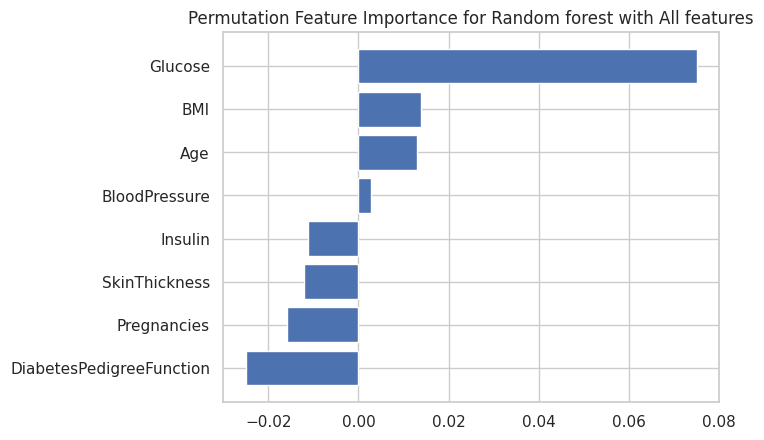

In [314]:
from sklearn.inspection import permutation_importance

result = permutation_importance(random_forest_model_2, test_x_scaled, y_test, n_repeats=10, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.barh(test_x_scaled_df.columns[sorted_idx], result.importances_mean[sorted_idx])
plt.title("Permutation Feature Importance for Random forest with All features")
plt.show()

# Global Surrogate Tree

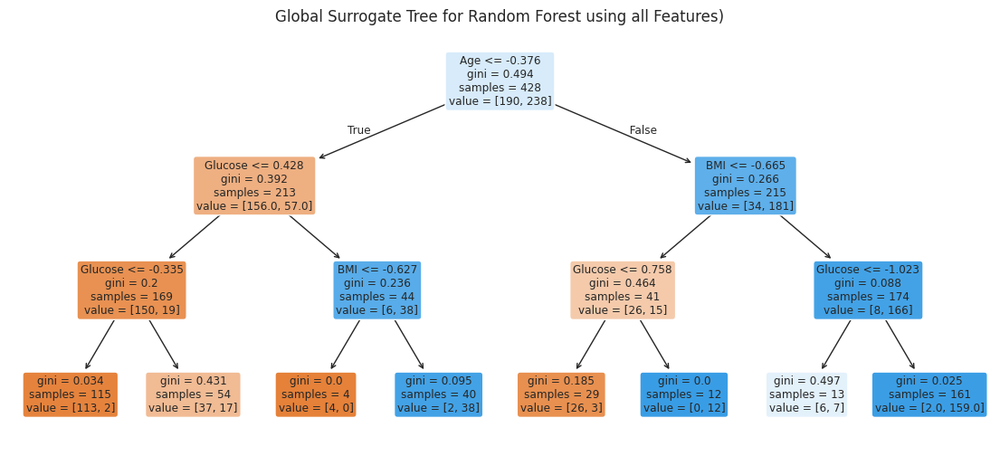

In [305]:
preds = random_forest_model_2.predict(train_x_scaled)
surrogate = DecisionTreeClassifier(max_depth=3, random_state=42)
surrogate.fit(train_x_scaled, preds)

plt.figure(figsize=(14, 6))
tree.plot_tree(surrogate, feature_names=train_x_scaled_df.columns, filled=True, rounded=True)
plt.title(f"Global Surrogate Tree for Random Forest using all Features)")
plt.show()


# ROC AUC

In [333]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

def plot_roc_auc(model, X_test, y_test, model_name):
    # Get predicted probabilities
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_proba = model.decision_function(X_test)
        y_proba = (y_proba - y_proba.min()) / (y_proba.max() - y_proba.min())

    # Calculate ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc = roc_auc_score(y_test, y_proba)

    # Plot
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve Comparison')
    plt.legend()





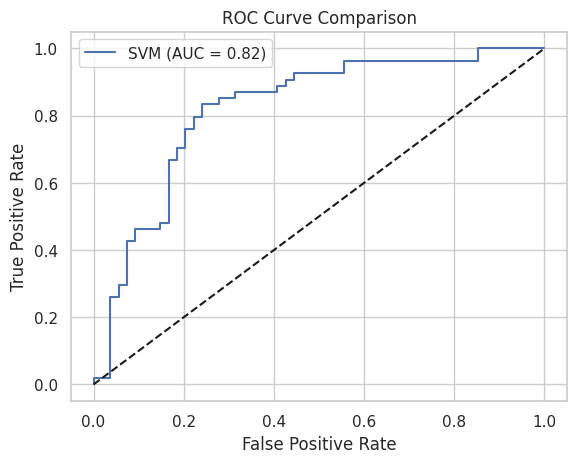

In [331]:
# For SVM
plot_roc_auc(svm_model_2, test_x_scaled, y_test, "SVM")

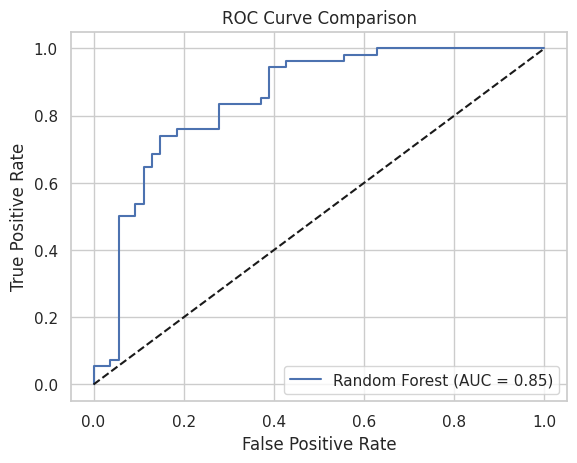

In [332]:
# For Random Forest
plot_roc_auc(random_forest_model_2, test_x_scaled, y_test, "Random Forest")